# FRBID: Fast Radio Burst Intelligent Distinguisher using deep learning.


    Authors : Zafiirah Hosenie
    Email : zafiirah.hosenie@gmail.com or zafiirah.hosenie@postgrad.manchester.ac.uk
    Affiliation : The University of Manchester, UK.
    License : MIT
    Status : Under Development
    Description : Python implementation for FRBID: Fast Radio Burst Intelligent Distinguisher.
    This code is tested in Python 3 version 3.6


In [1]:
import warnings
warnings.filterwarnings("ignore")
import os
import numpy as np
import pandas as pd

import matplotlib.pylab as plt
from keras.utils import np_utils
from time import gmtime, strftime
from sklearn.model_selection import train_test_split

#from load_data import shuffle_all, load_data
from frbid_code.model import compile_model,model_save 
from frbid_code.plot import optimsation_curve, feature_maps, plot_images
from frbid_code.evaluation import model_prediction, save_classified_examples
from frbid_code.util import makedirs, ensure_dir
from frbid_code.load_data import load_data, shuffle_all

from keras.layers import Input, Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Activation, concatenate
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Model
from keras.callbacks import ModelCheckpoint
import keras


import tensorflow as tf
from keras.backend.tensorflow_backend import set_session


config = tf.ConfigProto()
#config.gpu_options.allow_growth = True
config.gpu_options.per_process_gpu_memory_fraction = 0.8
sess = tf.Session(config=config)

#plt.rc('text', usetex=True)
#plt.rc('font',**{'family':'DejaVu Sans','serif':['Palatino']})
figSize  = (12, 8)
fontSize = 20
%matplotlib inline


Using TensorFlow backend.


In [2]:
# Parameters to change
nClasses   = 2  # The number of classes we are classifying: RFI and FRB
training   = True # If we want to train the CNN, training = True, else it will load the existing model
model_cnn_name = 'MULTIINPUT'  # The network name choose from: 'MULTIINPUT'
seed       = 4
output_directory = os.path.join("./frbid_output/", model_cnn_name, strftime("%Y_%m_%d_%H_%M_%S", gmtime()))
makedirs(output_directory)


## Load training and test set
Then convert labels to one hot encoding

In [3]:
# Load the training and test set
X_train_dm, X_train_freq, y_train, ID_train = load_data(csv_files='./data/csv_labels/train_set.csv', data_dir = './data/training_set/',n_images = 'dm_time_fq_time')
X_test_dm, X_test_freq, y_test, ID_test    = load_data(csv_files='./data/csv_labels/test_set.csv', data_dir = './data/testing_set/',n_images = 'dm_time_fq_time')


In [4]:
# stack so we can split on the same pair of images
x_train_comp = np.stack((X_train_dm, X_train_freq), axis=3)
X_test = np.stack((X_test_dm, X_test_freq), axis=3)
x_train_comp.shape

(19995, 256, 256, 2, 1)

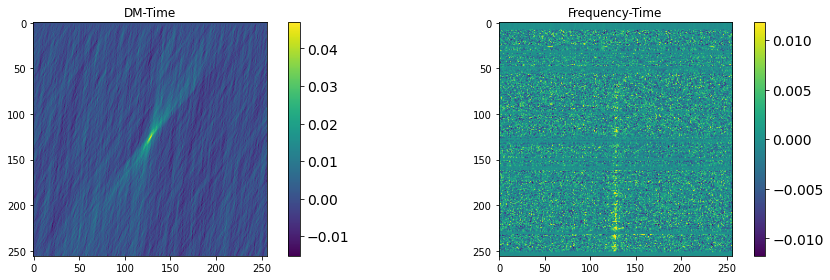

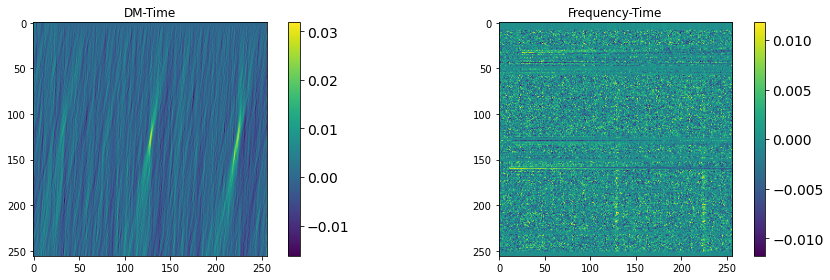

In [5]:
plot_images(data=X_test[10:12], ID=None, y_true=None, odir=None, savefig=False)

In [6]:
# Split data into training and validation and then take the dm and freq apart
x_train, x_val, y_train, y_val = train_test_split(x_train_comp, y_train, test_size = 0.3, random_state=42)

# take them apart
X_train_dm = x_train[:,:,:,0]
X_val_dm = x_val[:,:,:,0]

X_train_freq= x_train[:,:,:,1]
X_val_freq = x_val[:,:,:,1]

print("Total number of training instances: {}".format(str(len(y_train))))
print("Number of training examples in class 0: {}".format(str(len(np.where(y_train == 0)[0]))))
print("Number of training examples in class 1: {}".format(str(len(np.where(y_train == 1)[0]))))
print("Total number of validation instances: {}".format(str(len(y_val))))
print("Number of validation examples in class 0: {}".format(str(len(np.where(y_val == 0)[0]))))
print("Number of validation examples in class 1: {}".format(str(len(np.where(y_val == 1)[0]))))
print("Total number of test instances: {}".format(str(len(y_test))))
print("Number of test examples in class 0: {}".format(str(len(np.where(y_test == 0)[0]))))
print("Number of test examples in class 1: {}".format(str(len(np.where(y_test == 1)[0]))))


Total number of training instances: 13996
Number of training examples in class 0: 7000
Number of training examples in class 1: 6996
Total number of validation instances: 5999
Number of validation examples in class 0: 2995
Number of validation examples in class 1: 3004
Total number of test instances: 1291
Number of test examples in class 0: 291
Number of test examples in class 1: 1000


In [7]:
# Transform the vector of class integers into a one-hot encoded matrix using np_utils.to_categorical()
yTrain1h   = np_utils.to_categorical(y_train, nClasses)
yTest1h    = np_utils.to_categorical(y_test, nClasses)
yVal1h    = np_utils.to_categorical(y_val, nClasses)
print('The training set consists of {}'.format(X_train_dm.shape))
print('The testing set consists of {}'.format(X_test_dm.shape))
print('The validation set consists of {}'.format(X_val_dm.shape))


The training set consists of (13996, 256, 256, 1)
The testing set consists of (1291, 256, 256, 1)
The validation set consists of (5999, 256, 256, 1)


## Model training

In [8]:
'''
This function compile the model, apply early stopping to avoid overfitting
and also apply data augmentation if we set it to True

INPUTS:
        params: The model name we want to train for e.g 'MULTIINPUT'
        dm_img_shape: The shape of the dm image (256,256,1), or (X_train_dm.shape[1],X_train_dm.shape[2],X_train_dm.shape[3])
        freq_img_shape: The shape of the freq image (256,256,1), or (X_train_freq.shape[1],X_train_freq.shape[2],X_train_freq.shape[3])
        save_model_dir: The directory we want to save the history of the model [accuracy, loss]
        X_train_dm, X_train_freq: The training set for dm and freq images, say having shape (Nimages, 256pix, 256pix, 1 channel)
        X_val_dm,X_val_freq: The tvalidation set for dm and freq images, say having shape (Nimages, 256pix, 256pix, 1 channel)
        y_train, y_val: The label for training and validation set- transform to one-hot encoding having shape (Nimages, 2) in the format array([[0., 1.],[1., 0.])
        batch_size: Integer values values can be in the range [32, 64, 128, 256]
        epoch: The number of iteration to train the network. Integer value varies in the range [10, 50, 100, 200, ...]
        lr: The learning rate for the optimisation values can vary from [0.1, 0.01, 0.001, 0.0001]
        class_weight: If we want the model to give more weights to the class we are interested then set it to {0:0.25,1:0.75} or None
        early_stopping: Stop the network from training if val_loss stop decreasing if TRUE
        save_model: set TRUE to save the model after training
        data_augmentation: set TRUE if we want to apply data augmentation

OUTPUTS:
    history: The logs of the accuracy and loss during optimization
    modelCNN: The fully trained model

'''
dm_input_shape   = (X_train_dm.shape[1],X_train_dm.shape[2],X_train_dm.shape[3])
freq_input_shape = (X_train_freq.shape[1],X_train_freq.shape[2],X_train_freq.shape[3])

if training:
    
    history_, modelcnn = compile_model(params=model_cnn_name,
                                       dm_img_shape=dm_input_shape,
                                       freq_img_shape=freq_input_shape,
                                       save_model_dir='./frbid_model/', 
                                       X_train_dm=X_train_dm,
                                       X_train_freq=X_train_freq, 
                                       y_train=yTrain1h, 
                                       X_val_dm=X_val_dm,
                                       X_val_freq=X_val_freq, 
                                       y_val=yVal1h,
                                       batch_size=64, 
                                       epochs=30, 
                                       lr=0.0002, 
                                       class_weight = None,
                                       early_stopping=True,
                                       save_model=True,
                                       data_augmentation=False)
    
    #save model to disk so that we don't need to retrain the model each time
    model_save = model_save(modelcnn, model_name=model_cnn_name)
    

Instructions for updating:
keep_dims is deprecated, use keepdims instead
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 1)  0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 256, 256, 1)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 254, 254, 16) 160         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 254, 254, 16) 160         input_2[0][0]                    
____________________________________

Epoch 5/30
13996/13996 [==============================] - 44s 3ms/step - loss: 0.0530 - acc: 0.9820 - val_loss: 0.0504 - val_acc: 0.9837
Epoch 6/30
13996/13996 [==============================] - 44s 3ms/step - loss: 0.0458 - acc: 0.9841 - val_loss: 0.0556 - val_acc: 0.9832
Epoch 7/30
13996/13996 [==============================] - 44s 3ms/step - loss: 0.0415 - acc: 0.9853 - val_loss: 0.0550 - val_acc: 0.9838
Epoch 8/30
13996/13996 [==============================] - 45s 3ms/step - loss: 0.0329 - acc: 0.9886 - val_loss: 0.0583 - val_acc: 0.9822
Epoch 9/30
13996/13996 [==============================] - 45s 3ms/step - loss: 0.0278 - acc: 0.9900 - val_loss: 0.0681 - val_acc: 0.9805
Epoch 10/30
13996/13996 [==============================] - 45s 3ms/step - loss: 0.0308 - acc: 0.9894 - val_loss: 0.0550 - val_acc: 0.9833
Epoch 11/30
13996/13996 [==============================] - 44s 3ms/step - loss: 0.0185 - acc: 0.9940 - val_loss: 0.0750 - val_acc: 0.9855
Epoch 12/30
13996/13996 [==============

## Prediction on Test set

Loaded model from disk
Confusion matrix, without normalization
[[291   0]
 [ 48 952]]


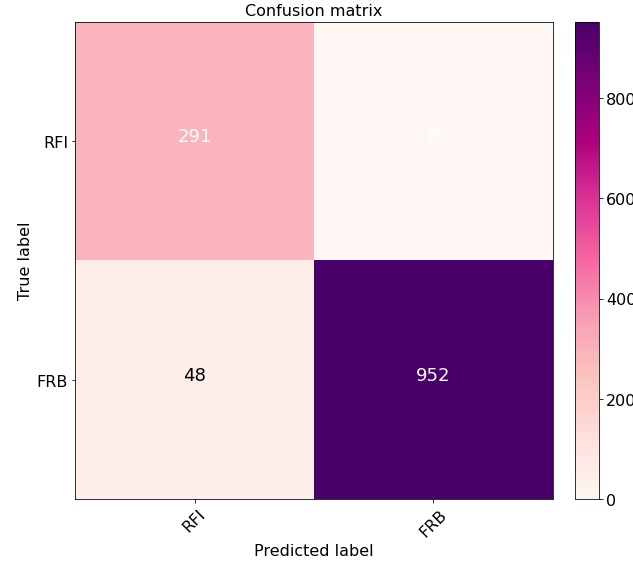

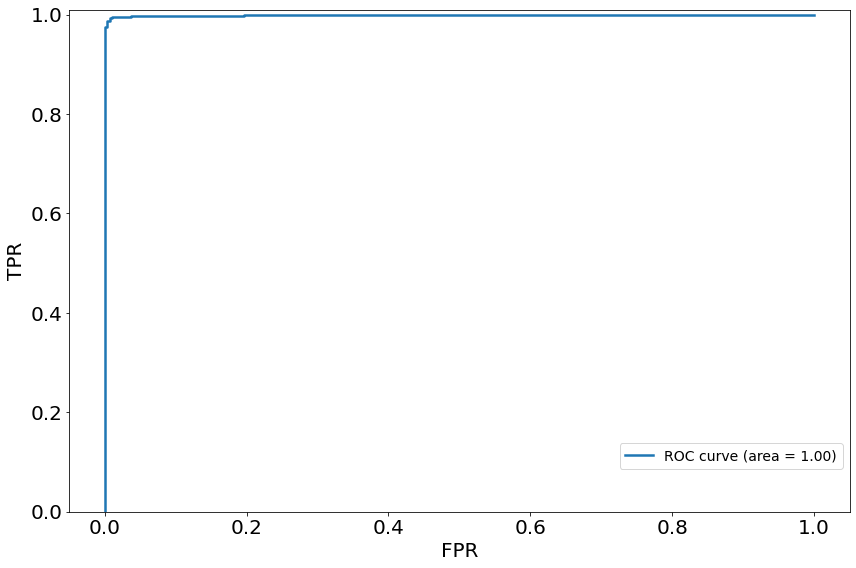

In [9]:
'''
Function to evaluate the trained model

INPUTS:
    fit_model: if load_model is False, it will fit the existing model that just trained, for e.g modelCNN, Else, it should be NONE
    odir: The directory to save the plots
    model_name: if load_model is True, model_name = 'NET1_32_64', 'NET1_64_128', 'NET1_128_256', 'NET2', 'NET3', Either of them
    X_test, y_test: Evaluate the trained model on a sample of test set having images and its label
    classes: List with the names of the classes considered. Used to label confusion matrix. 
    cm_norm: True if we want the conf_matrix to be between 0 to 1 or False if we want the number of samples correctly classified
    load_model: True if we want to use an already pre-trained model, else False

OUTPUTS:
    ypred: An array of prediction for the test set array[[0 1 0 0 1 ....]]
    balanced_accuracy, MCC, conf_mat: The metrics  values when evaluating the trained model 
    misclassified: An array of indices from the test set indices that indicates which indices (images) got misclassified
    fit_model: return the train model
    correct_classification: An array of indices from the test set indices that indicates which indices (images) are correctly classified
    probability: The overall probability of each candidate varies betwwen 0 to 1. For a candidate, it outputs prob = [0.1, 0.9], this
                 candidate is therefore a real candidate with prob 0.9 and has a probability of 0.1 that it is bogus
'''


ypred, balance_accuracy, MCC, conf_mat, misclassified, model_loaded, correct_classification, probability = model_prediction(fit_model=None,
                                                                                                                            odir=output_directory,
                                                                                                                            model_name=model_cnn_name,
                                                                                                                            X_test_dm=X_test_dm,
                                                                                                                            X_test_freq= X_test_freq,
                                                                                                                            y_test=y_test,
                                                                                                                            classes=["RFI" , "FRB"],
                                                                                                                            cm_norm=False,
                                                                                                                            load_model=True)



## Plot the feature maps for the first convolutional neural for the FRB and RFI

In [10]:
#y_train[0]

2 conv2d_1 (?, 254, 254, 16)
3 conv2d_4 (?, 254, 254, 16)
8 conv2d_2 (?, 125, 125, 32)
9 conv2d_5 (?, 125, 125, 32)
14 conv2d_3 (?, 60, 60, 64)
15 conv2d_6 (?, 60, 60, 64)
(13996, 254, 254, 16)


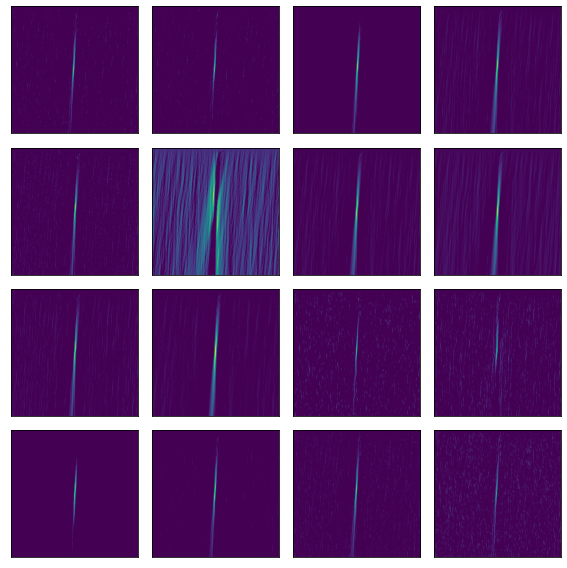

In [11]:
real_dm_featuremap = feature_maps(model= model_loaded, x_train=[X_train_dm,X_train_freq], y_train = y_train, img_index=3, ofname=os.path.join(output_directory, "feature_map_real_dm_channel.pdf"),input_image='DM')


2 conv2d_1 (?, 254, 254, 16)
3 conv2d_4 (?, 254, 254, 16)
8 conv2d_2 (?, 125, 125, 32)
9 conv2d_5 (?, 125, 125, 32)
14 conv2d_3 (?, 60, 60, 64)
15 conv2d_6 (?, 60, 60, 64)
(13996, 254, 254, 16)


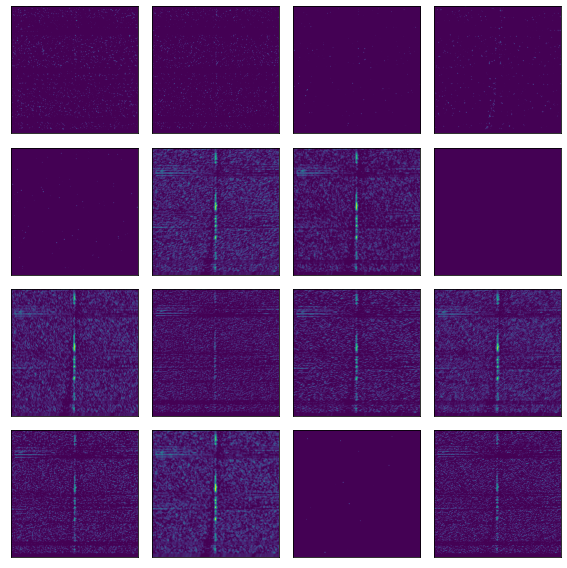

In [12]:
real_freq_featuremap = feature_maps(model= model_loaded, x_train=[X_train_dm,X_train_freq], y_train = y_train, img_index=3, ofname=os.path.join(output_directory, "feature_map_real_freq_channel.pdf"),input_image='FREQ')


2 conv2d_1 (?, 254, 254, 16)
3 conv2d_4 (?, 254, 254, 16)
8 conv2d_2 (?, 125, 125, 32)
9 conv2d_5 (?, 125, 125, 32)
14 conv2d_3 (?, 60, 60, 64)
15 conv2d_6 (?, 60, 60, 64)
(13996, 254, 254, 16)


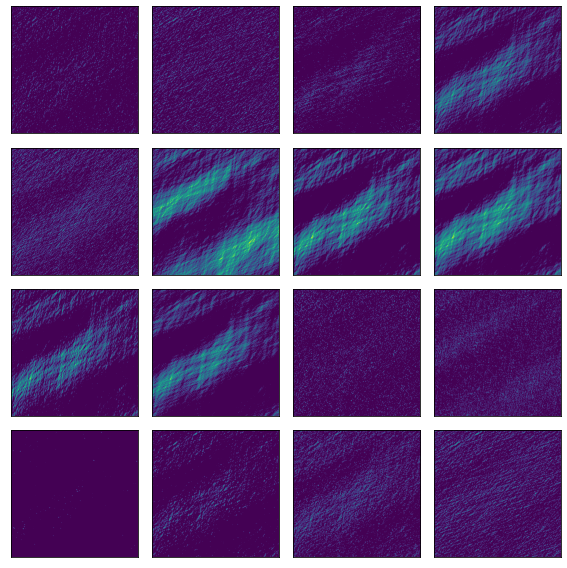

In [13]:
bogus_dm_featuremap = feature_maps(model= model_loaded, x_train=[X_train_dm,X_train_freq], y_train = y_train, img_index=0, ofname=os.path.join(output_directory, "feature_map_bogus_dm_channel.pdf"),input_image='DM')


2 conv2d_1 (?, 254, 254, 16)
3 conv2d_4 (?, 254, 254, 16)
8 conv2d_2 (?, 125, 125, 32)
9 conv2d_5 (?, 125, 125, 32)
14 conv2d_3 (?, 60, 60, 64)
15 conv2d_6 (?, 60, 60, 64)
(13996, 254, 254, 16)


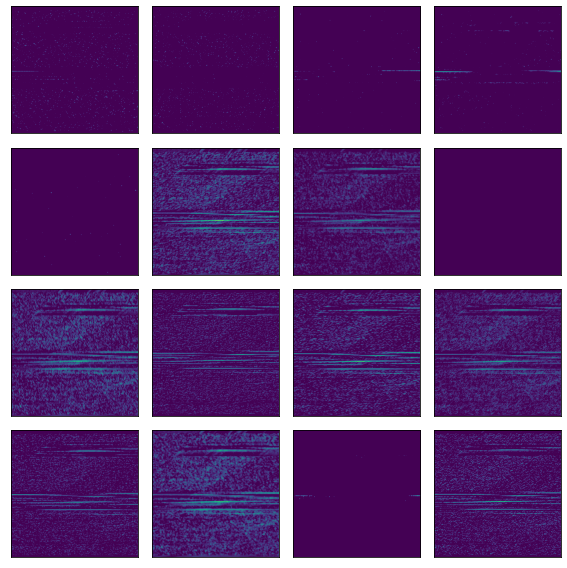

In [14]:
bogus_freq_featuremap = feature_maps(model= model_loaded, x_train=[X_train_dm,X_train_freq], y_train = y_train, img_index=0, ofname=os.path.join(output_directory, "feature_map_bogus_freq_channel.pdf"),input_image='FREQ')


## Plot Optimization curves

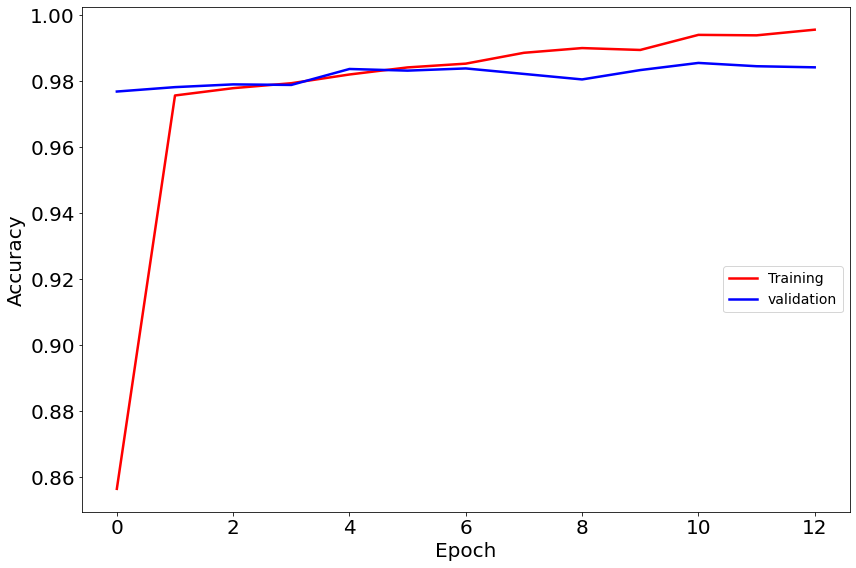

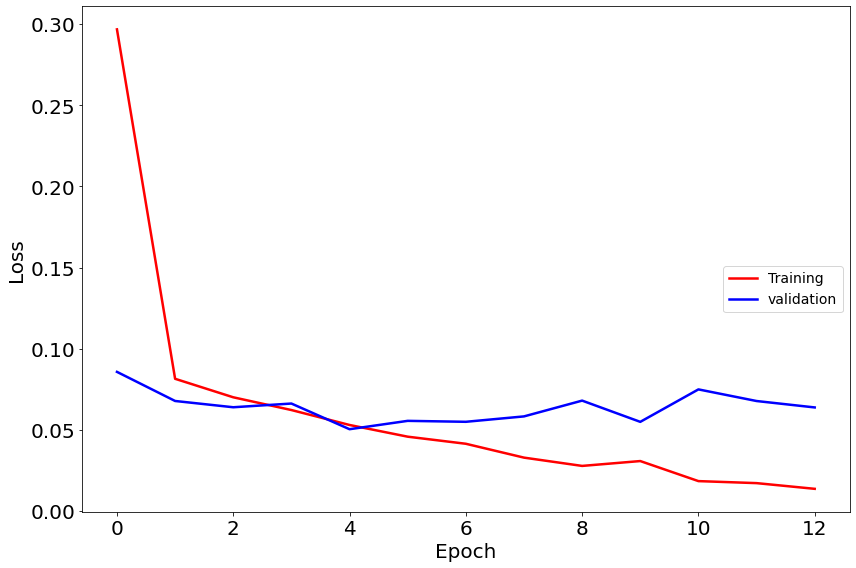

In [15]:
if training:
    curves_loss_accuracy = optimsation_curve(history_,plot_dir1=os.path.join(output_directory, "Accuracy.pdf"),plot_dir2=os.path.join(output_directory, "Loss.pdf"))

## Plotting all misclassification

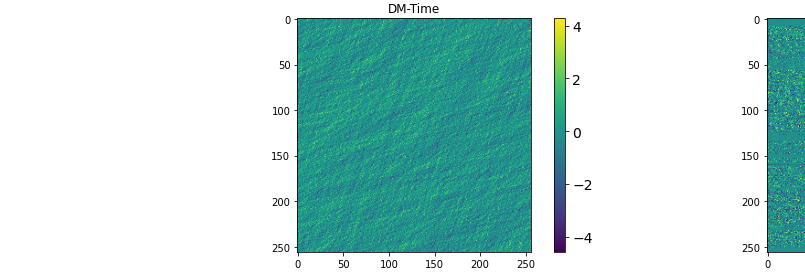

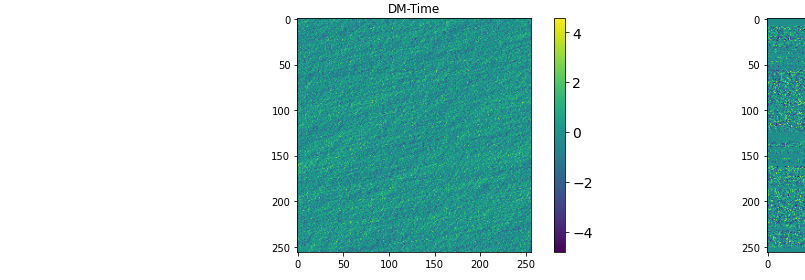

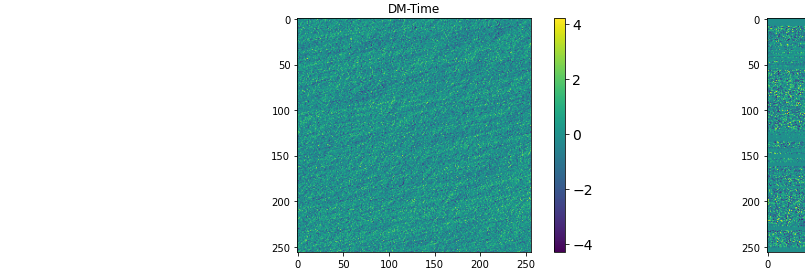

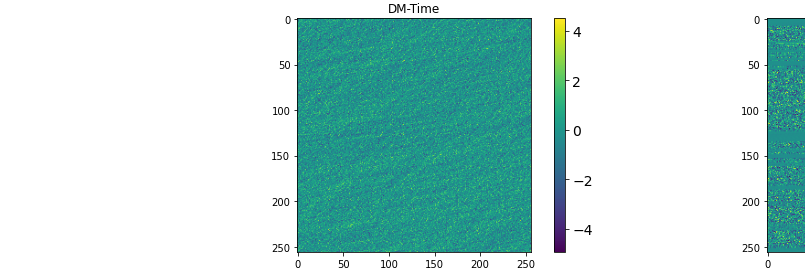

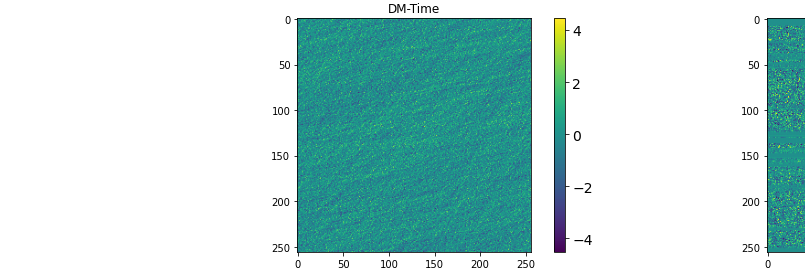

...

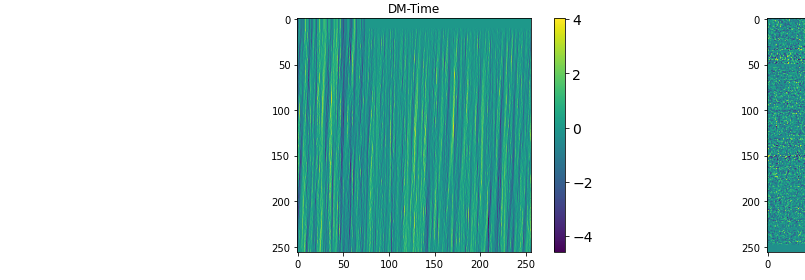

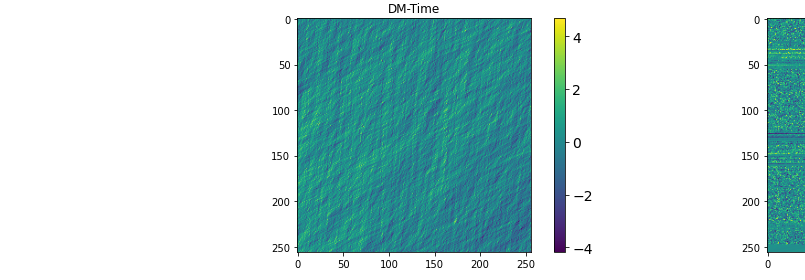

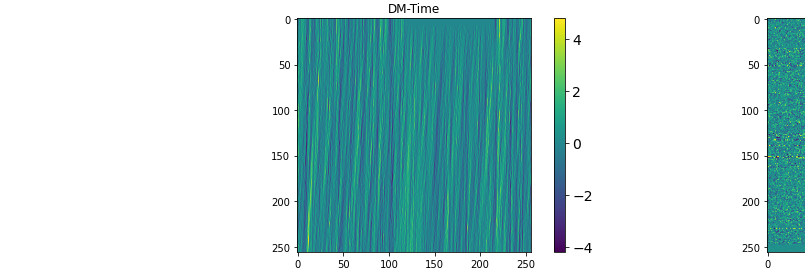

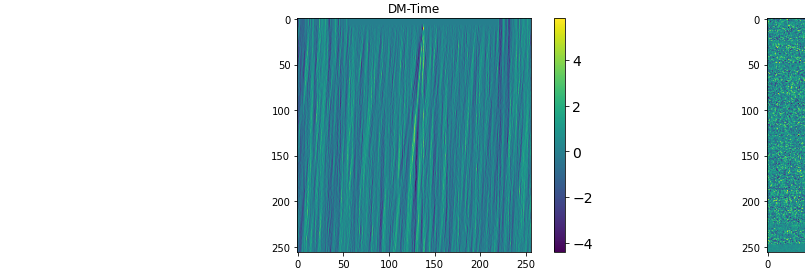

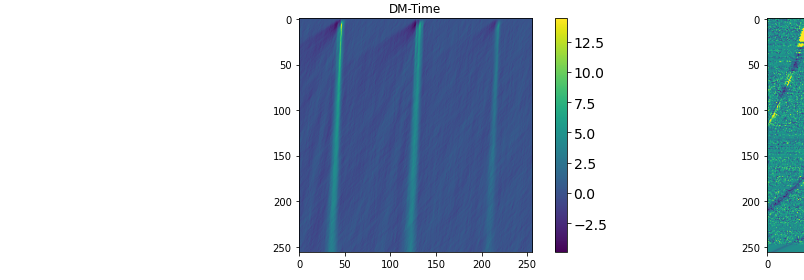

In [16]:
misclassified_array = misclassified
y_true              = y_test[misclassified_array]
ID_misclassified    = ID_test[misclassified_array]
misclassified_img   = X_test[misclassified_array]
plot_images(misclassified_img*255.,ID_misclassified, y_true, odir=output_directory+'/misclassified_examples/', savefig=True,show=False)


# Save probability of correctly classified real and bogus in csv file

In [17]:
overall_probability_real, correctly_classified_bogus, correctly_classified_real=save_classified_examples(X_test, y_test, ID_test, correct_classification, probability,\
                                                                               odir_real=output_directory+'/classified_examples/1/',
                                                                               odir_bogus=output_directory+'/classified_examples/0/',savecsv = True)

In [18]:
overall_probability_real

,transientid,ML_PROB_FRB
0,59049.5164386894_DM_42.98_beam_149C_frbid.hdf5,1.000000e+00
1,59049.532366364_DM_114.20_beam_666C_frbid.hdf5,1.289791e-02
2,59049.5356864285_DM_279.06_beam_477C_frbid.hdf5,5.969365e-03
3,59049.5358192543_DM_282.75_beam_19C_frbid.hdf5,4.406417e-02
4,59049.5379203981_DM_420.45_beam_0I_frbid.hdf5,8.346475e-03
...,...,...
1286,59149.261456137305_DM_25.48_beam_116C_frbid.hdf5,1.046689e-15
1287,59149.2614698491_DM_39.60_beam_249C_frbid.hdf5,5.724711e-13
1288,59149.261510809105_DM_48.81_beam_0I_frbid.hdf5,4.137237e-16
1289,59149.2615524036_DM_36.84_beam_209C_frbid.hdf5,3.714047e-23


# Analysis of ML Probability output P(FRB)

In [19]:
misclassified_prob = pd.DataFrame()
for i in ID_misclassified:
    extract_rows = overall_probability_real[overall_probability_real['transientid']==i]
    misclassified_prob = misclassified_prob.append(extract_rows)

In [20]:
real = overall_probability_real[overall_probability_real['ML_PROB_FRB']>=0.5]
bogus = overall_probability_real[overall_probability_real['ML_PROB_FRB']<0.5]
print('Number of candidate classified as Real is {}'.format(real.shape[0]))
print('Number of candidate classified as Bogus is {}'.format(bogus.shape[0]))

Number of candidate classified as Real is 952
Number of candidate classified as Bogus is 339


Substituting symbol P from STIXNonUnicode
Substituting symbol P from STIXNonUnicode
Substituting symbol P from STIXNonUnicode
Substituting symbol P from STIXNonUnicode


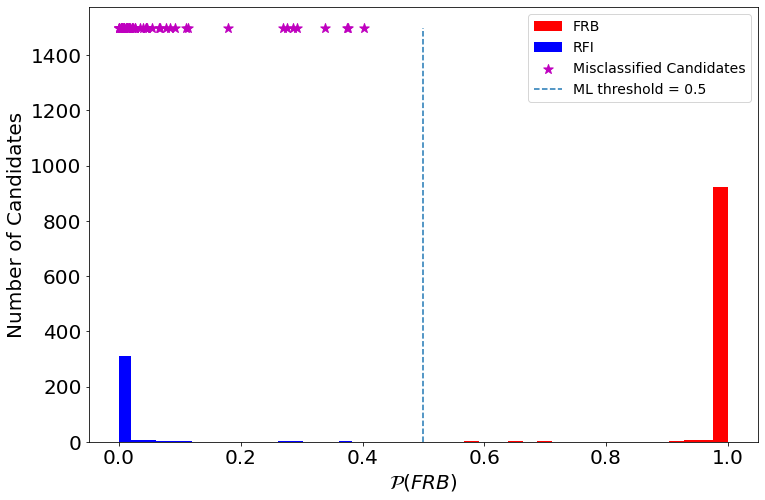

In [21]:
plt.figure(figsize=figSize)
plt.hist(real['ML_PROB_FRB'],color='r',bins=20, label='FRB')
plt.hist(bogus['ML_PROB_FRB'],color='b',bins=20,label='RFI')
plt.scatter(misclassified_prob['ML_PROB_FRB'],[1500]*misclassified_prob.shape[0], marker='*', s=100, color='m',label='Misclassified Candidates')
plt.vlines(0.5, ymin=0, ymax=1500, linestyles='dashed',label='ML threshold = 0.5')
plt.xlabel("$\mathcal{P}(FRB)$",fontsize=fontSize)
plt.ylabel("Number of Candidates",fontsize=fontSize)
plt.tick_params(axis='both', labelsize=fontSize)
plt.legend(loc="best",prop={'size':14},bbox_to_anchor=(1,1.0))
makedirs(output_directory+'/plots/')
plt.savefig(output_directory+'/plots/ML_probability_output.pdf', bbox_inches='tight', pad_inches=0.1)
plt.show()